In [1]:
# imports
import pandas as pd
from keras import models
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import LabelEncoder
import dalex as dx

from matplotlib.pyplot import *

2022-11-27 18:34:16.276118: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [61]:
test_df

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave.points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave.points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,0.334294,0.379744,0.335708,0.262236,0.493444,0.414847,0.433080,0.435787,0.501236,0.326397,...,0.419121,0.308655,0.240782,0.540644,0.373468,0.461886,0.590591,0.365985,0.277020,0
1,0.642867,0.476056,0.632743,0.568915,0.404642,0.404839,0.503037,0.628633,0.319627,0.114744,...,0.472799,0.660650,0.573264,0.383466,0.368458,0.463267,0.784077,0.261187,0.099968,1
2,0.484923,0.411745,0.487511,0.404590,0.577992,0.469352,0.586077,0.633986,0.504262,0.194406,...,0.456963,0.465851,0.395072,0.616574,0.375365,0.550269,0.721301,0.326942,0.219868,1
3,0.330562,0.345469,0.338671,0.253729,0.544811,0.498456,0.425879,0.372982,0.442819,0.484884,...,0.369441,0.270451,0.176356,0.556078,0.402529,0.438101,0.503254,0.262367,0.322833,0
4,0.283826,0.217026,0.284390,0.212807,0.495165,0.435795,0.397302,0.359063,0.446458,0.416368,...,0.271380,0.202966,0.150879,0.487569,0.341698,0.378854,0.487578,0.207560,0.229027,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166,0.350695,0.299782,0.337892,0.274445,0.481262,0.199706,0.292558,0.377288,0.324076,0.160691,...,0.273902,0.246398,0.192729,0.454684,0.116434,0.288075,0.449589,0.220832,0.084076,0
167,0.450088,0.611095,0.437842,0.364918,0.333213,0.288469,0.310130,0.387875,0.457850,0.167089,...,0.620315,0.372990,0.293300,0.286787,0.238301,0.358712,0.613424,0.300920,0.131889,0
168,0.189833,0.359732,0.199661,0.142266,0.469180,0.491666,0.553383,0.429758,0.367417,0.692363,...,0.412052,0.165510,0.119051,0.458068,0.437740,0.527669,0.583566,0.275976,0.481067,0
169,0.404315,0.581556,0.420612,0.326890,0.637638,0.603770,0.563868,0.579598,0.670518,0.513326,...,0.636249,0.365245,0.280206,0.764673,0.538068,0.519661,0.722966,0.497769,0.494947,1


In [2]:
# read in test set
test_df = pd.read_csv('/Users/taylor/Desktop/DS340W/term_project/data/wisconsin/wisconsin_test.csv')
test_dataset = test_df.values

test_X = test_dataset[:,0:30].astype(float)
test_Y = test_dataset[:,30]

# encode class values as integers
encoder = LabelEncoder()

encoder.fit(test_Y)
encoded_test_Y = encoder.transform(test_Y)

In [3]:
# Reconstruct models
baseNet = models.load_model('/Users/taylor/Desktop/DS340W/term_project/models/baseNet')
smallNet = models.load_model('/Users/taylor/Desktop/DS340W/term_project/models/smallNet')
bigNet5 = models.load_model('/Users/taylor/Desktop/DS340W/term_project/models/bigNet5')
bigNet7 = models.load_model('/Users/taylor/Desktop/DS340W/term_project/models/bigNet7')
bigNet10 = models.load_model('/Users/taylor/Desktop/DS340W/term_project/models/bigNet10')
bigNet15 = models.load_model('/Users/taylor/Desktop/DS340W/term_project/models/bigNet15')

2022-11-27 18:34:28.036695: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [4]:
# construct Dalex explainers
baseExp = dx.Explainer(baseNet, test_X, encoded_test_Y, label = "diagnosis")
smallExp = dx.Explainer(smallNet, test_X, encoded_test_Y, label = "diagnosis")
big5Exp = dx.Explainer(bigNet5, test_X, encoded_test_Y, label = "diagnosis")
big7Exp = dx.Explainer(bigNet7, test_X, encoded_test_Y, label = "diagnosis")
big10Exp = dx.Explainer(bigNet10, test_X, encoded_test_Y, label = "diagnosis")
big15Exp = dx.Explainer(bigNet15, test_X, encoded_test_Y, label = "diagnosis")

Preparation of a new explainer is initiated

  -> data              : numpy.ndarray converted to pandas.DataFrame. Columns are set as string numbers.
  -> data              : 171 rows 30 cols
  -> target variable   : 171 values
  -> model_class       : keras.engine.sequential.Sequential (default)
  -> label             : diagnosis
  -> predict function  : <function yhat_tf_regression at 0x7fdf2885bd30> will be used (default)
1/1 [==============================] - 1s 739ms/step
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
6/6 [==============================] - 0s 2ms/step
  -> predicted values  : min = 8.44e-08, mean = 0.379, max = 1.0
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
6/6 [==============================] - 0s 3ms/step
  -> residuals         : min = -0.889, mean = -0.0101, max = 0.816
  -> model_info        : package keras

A new explainer has been created!
Preparation of a 

In [5]:
# Get model-level explanations for each explainer:

In [13]:
    # Explore feature performance:

In [23]:
baseExp.model_parts(loss_function = 'auc').plot()

6/6 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 1ms/step


In [24]:
smallExp.model_parts(loss_function = 'auc').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [25]:
big5Exp.model_parts(loss_function = 'auc').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [26]:
big7Exp.model_parts(loss_function = 'auc').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [27]:
big10Exp.model_parts(loss_function = 'auc').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 4ms/step


In [28]:
big15Exp.model_parts(loss_function = 'auc').plot()

6/6 [==============================] - 0s 3ms/step


6/6 [==============================] - 0s 2ms/step


In [43]:
# save model diagnostics

In [44]:
baseDiagnostics = baseExp.model_diagnostics().result
baseDiagnostics.to_csv('baseDiagnosticsTable.csv', index=False)

In [45]:
smallDiagnostics = smallExp.model_diagnostics().result
smallDiagnostics.to_csv('smallDiagnosticsTable.csv', index=False)

In [46]:
big5Diagnostics = big5Exp.model_diagnostics().result
big5Diagnostics.to_csv('big5DiagnosticsTable.csv', index=False)

In [47]:
big7Diagnostics = big7Exp.model_diagnostics().result
big7Diagnostics.to_csv('big7DiagnosticsTable.csv', index=False)

In [48]:
big10Diagnostics = big10Exp.model_diagnostics().result
big10Diagnostics.to_csv('big10DiagnosticsTable.csv', index=False)

In [49]:
big15Diagnostics = big15Exp.model_diagnostics().result
big15Diagnostics.to_csv('big15DiagnosticsTable.csv', index=False)

In [50]:
# prediction level explanations ~ SHAPley values

In [52]:
# create new instance for prediction
X = pd.DataFrame({'radius_mean': [.372],
                  'texture_mean': [.1327],
                  'perimeter_mean': [.2988],
                  'area_mean': [.2742],
                  'smoothness_mean': [.4041],
                  'compactness_mean': [.2756],
                  'concavity_mean': [0.2443],
                  'concave.points_mean': [0.3738],
                  'symmetry_mean': [0.3982],
                  'fractal_dimension_mean': [0.1856],
                  'radius_se': [0.0104],
                  'texture_se': [0.0595],
                  'perimeter_se': [0.0041],
                  'area_se': [0.01913],
                 'smoothness_se': [0.1497],
                 'compactness_se': [0.1762],
                 'concavity_se': [0.1521],
                 'concave.points_se': [0.3197],
                 'symmetry_se': [0.1204],
                 'fractal_dimension_se': [0.0632],
                 'radius_worst': [0.2948],
                 'texture_worst': [0.2399],
                 'perimeter_worst': [0.2608],
                 'area_worst': [0.1774],
                 'smoothness_worst': [0.5126],
                 'compactness_worst': [0.3191],
                 'concavity_worst': [0.4081],
                 'concave.points_worst': [0.7192],
                 'symmetry_worst': [0.3966],
                 'fractal_dimension_worst': [0.1647]},
                 index = ['X'])

#X, y = test_df.drop('diagnosis', axis=1), test_df.diagnosis

In [53]:
baseExp.predict_parts(X, type='shap').plot()

6/6 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [54]:
smallExp.predict_parts(X, type='shap').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 1ms/step


In [56]:
big5Exp.predict_parts(X, type='shap').plot()

6/6 [==============================] - 0s 4ms/step


6/6 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [57]:
big7Exp.predict_parts(X, type='shap').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [58]:
big10Exp.predict_parts(X, type='shap').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [59]:
big15Exp.predict_parts(X, type='shap').plot()

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 7ms/step


6/6 [==============================] - 0s 6ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


In [60]:
# LIME explanations
baseNN_pparts = baseExp.predict_surrogate(new_observation = X)
smallNN_pparts = smallExp.predict_surrogate(new_observation = X)
big5NN_pparts = big5Exp.predict_surrogate(new_observation = X)
big7NN_pparts = big7Exp.predict_surrogate(new_observation = X)
big10NN_pparts = big10Exp.predict_surrogate(new_observation = X)
big15NN_pparts = big15Exp.predict_surrogate(new_observation = X)

157/157 [==============================] - 1s 3ms/step


In [62]:
# plotted explanations
baseNN_pparts.show_in_notebook()

In [63]:
smallNN_pparts.show_in_notebook()

In [64]:
big5NN_pparts.show_in_notebook()

In [65]:
big7NN_pparts.show_in_notebook()

In [66]:
big10NN_pparts.show_in_notebook()

In [67]:
big15NN_pparts.show_in_notebook()

In [78]:
# interpretable surrogate models

In [79]:
baseSurrogate = baseExp.model_surrogate()
baseSurrogate.performance

6/6 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 2ms/step


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



,mse,rmse,r2,mae,mad
DecisionTreeRegressor,0.015387,0.124044,0.92855,0.047368,0.009332


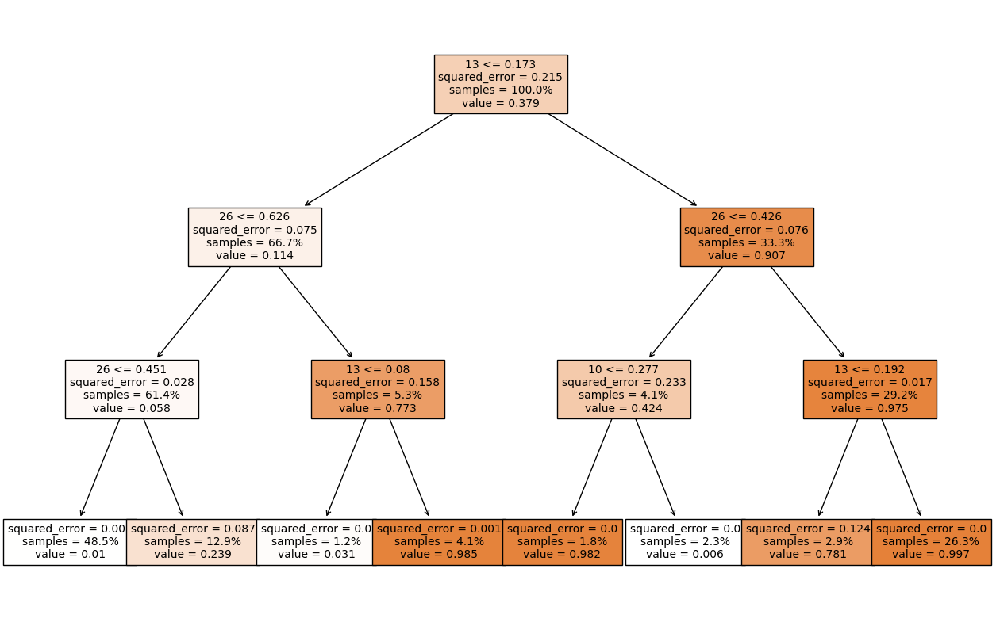

In [81]:
baseSurrogate.plot()

In [82]:
smallSurrogate = smallExp.model_surrogate()
smallSurrogate.performance

6/6 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 1ms/step


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



,mse,rmse,r2,mae,mad
DecisionTreeRegressor,0.010029,0.100145,0.952624,0.045337,0.011478


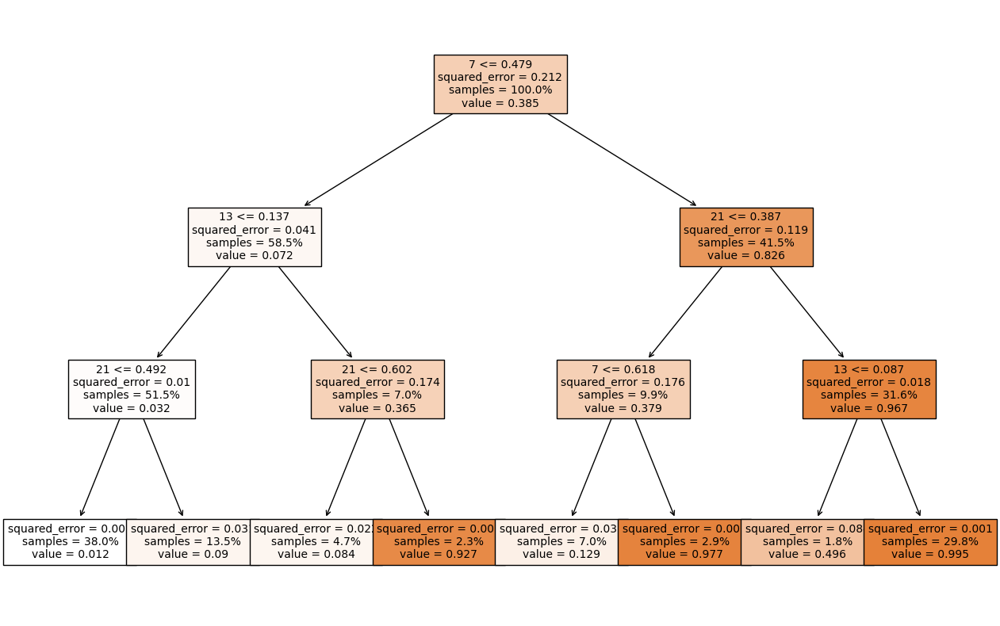

In [83]:
smallSurrogate.plot()

In [84]:
big5Surrogate = big5Exp.model_surrogate()
big5Surrogate.performance

6/6 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 2ms/step


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



,mse,rmse,r2,mae,mad
DecisionTreeRegressor,0.020691,0.143844,0.909495,0.05354,0.010632


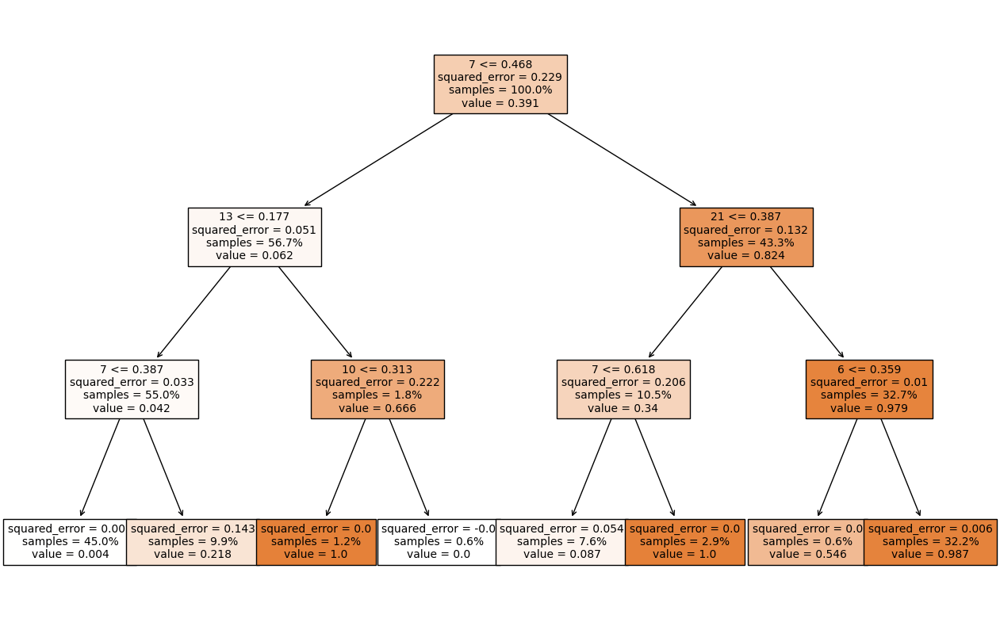

In [85]:
big5Surrogate.plot()

In [86]:
big7Surrogate = big7Exp.model_surrogate()
big7Surrogate.performance

6/6 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 1ms/step


6/6 [==============================] - 0s 2ms/step


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



,mse,rmse,r2,mae,mad
DecisionTreeRegressor,0.027519,0.165889,0.882228,0.060003,0.003578


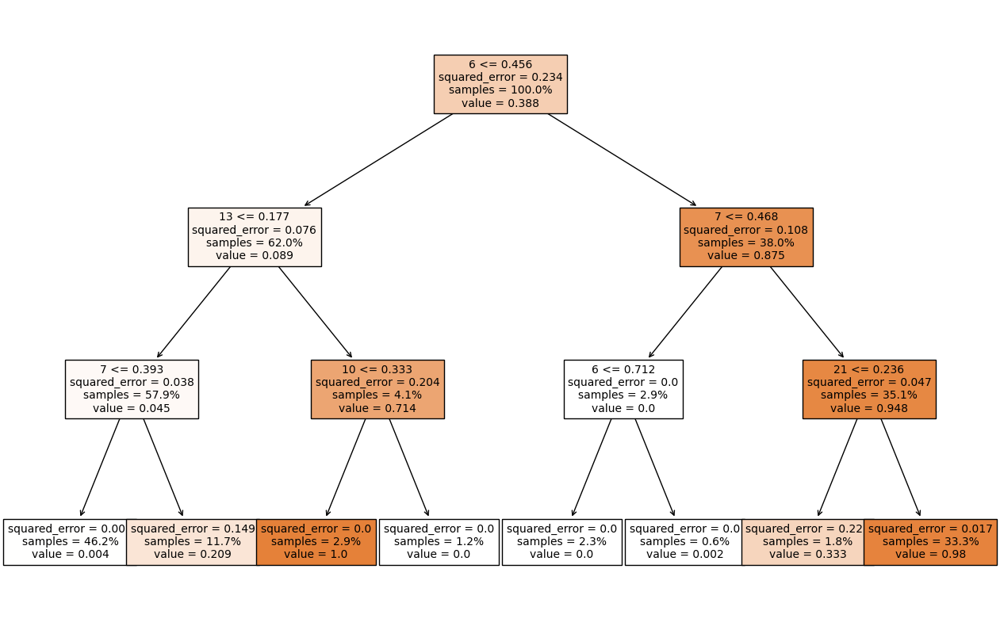

In [87]:
big7Surrogate.plot()

In [88]:
big10Surrogate = big10Exp.model_surrogate()
big10Surrogate.performance

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



,mse,rmse,r2,mae,mad
DecisionTreeRegressor,0.025089,0.158394,0.892632,0.053702,0.001169


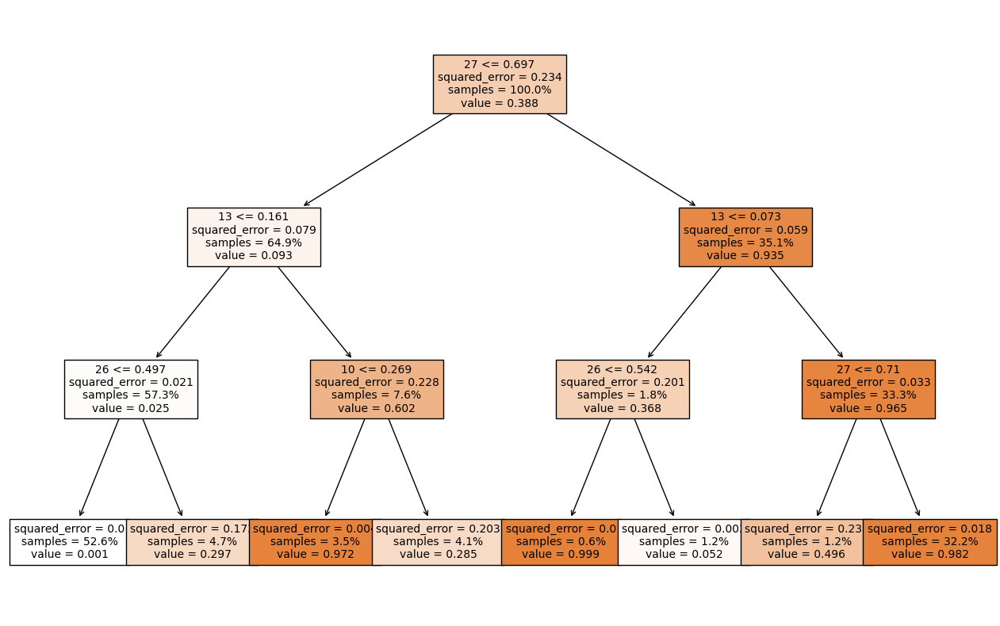

In [89]:
big10Surrogate.plot()

In [90]:
big15Surrogate = big15Exp.model_surrogate()
big15Surrogate.performance

6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


6/6 [==============================] - 0s 2ms/step


/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names



,mse,rmse,r2,mae,mad
DecisionTreeRegressor,0.016977,0.130295,0.926816,0.037634,0.024601


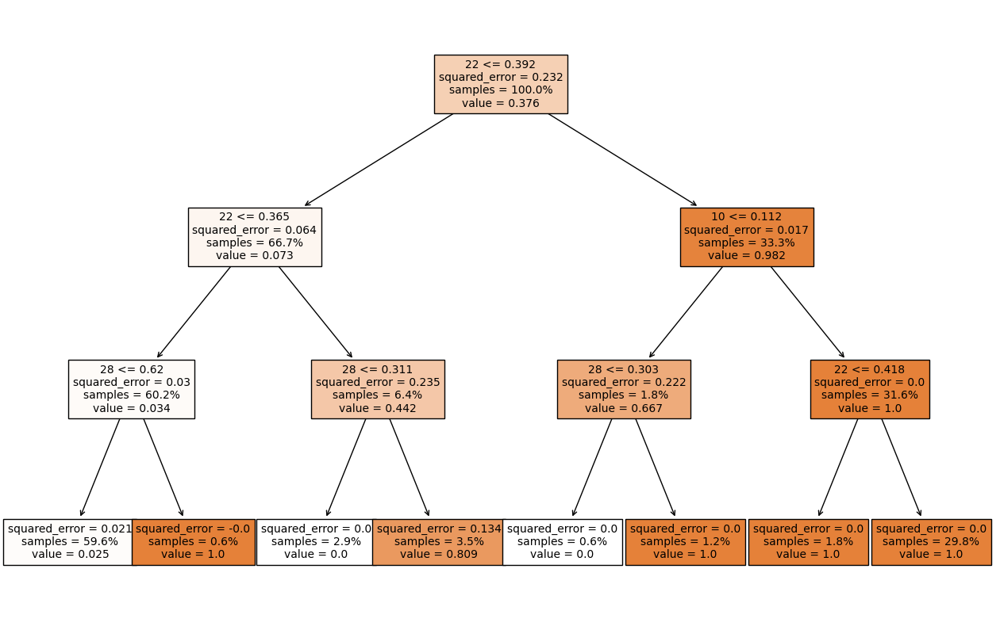

In [91]:
big15Surrogate.plot()